# Lab 2 - AI - Deep learning for Fish detection

**AL5.A.01 - BUT3 - IUT Vannes**

This lab focuses on training a YOLOv8 (You Only Look Once version 8) model to detect different types of aquatic life, including fish, jellyfish, penguins, puffins, sharks, starfish, and stingrays. Using the YOLOv8 architecture, we'll work through the process of loading datasets, training a custom object detection model, evaluating its performance, and testing it on unseen images.

## Import necessary libraries
- We use YOLOv8 from ultralytics
- We first install/upgrade all needed dependencies
- We also fix some things that may break in colab (`RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.`)
- The training data is retrieved from drive and unzipped to the disk for faster training and reducing bottlenecks. Get the file from https://drive.google.com/file/d/1N6rObDk-EoschR3vrtvfPm5Qn5EyaobW/view and put it at the root of your drive
- Also the gpu is called "0" instead of "gpu" like in pytorch

In [ ]:
%pip install -U ultralytics torch torchvision torchaudio seaborn opencv-python albumentations Pillow requests cv2

# Importing the required libraries
import os
import shutil
import random
import pandas as pd

import requests
from PIL import Image

import cv2
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import multiprocessing as mp

import torch
from ultralytics import YOLO

%matplotlib inline

# fix random seed for reproducibility
import numpy as np

np.random.seed(7)
mp.set_start_method("spawn")

# moves your model to train on your gpu if available else it uses your cpu
device = "0" if torch.cuda.is_available() else "cpu"
print(device)

# what is your GPU ?
!nvidia-smi

from google.colab import drive

drive.mount("/content/drive")

if not os.path.exists("/content/aquarium_pretrain"):
    drive_data_files = "/content/drive/MyDrive/aquarium_pretrain.zip"
    local_data_files = "/content/aquarium_pretrain.zip"
    shutil.copyfile(drive_data_files, local_data_files)
    !unzip /content/aquarium_pretrain.zip -d /content &> /dev/null
data_dir = "/content/aquarium_pretrain"

# Define the paths to the images and labels directories
train_images = "/content/aquarium_pretrain/train/images"
train_labels = "/content/aquarium_pretrain/train/labels"

val_images = "/content/aquarium_pretrain/valid/images"
val_labels = "/content/aquarium_pretrain/valid/labels"

test_images = "/content/aquarium_pretrain/test/images"
test_labels = "/content/aquarium_pretrain/test/labels"

# Define the path to the yaml data file
yaml_path = "/content/aquarium_pretrain/data.yaml"


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 874.1/874.1 kB 15.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 19.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 214.6/214.6 kB 14.2 MB/s eta 0:00:00
  Attempting uninstall: albucore
    Found existing installation: albucore 0.0.16
    Uninstalling albucore-0.0.16:
      Successfully uninstalled albucore-0.0.16
  Attempting uninstall: seaborn
    Found existing installation: seaborn 0.13.1
    Uninstalling seaborn-0.13.1:
      Successfully uninstalled seaborn-0.13.1
  Attempting uninstall: albumentations
    Found existing installation: albumentations 1.4.15
    Uninstalling albumentations-1.4.15:
      Successfully uninstalled albumentations-1.4.15
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see 

## Explore the dataset
Before training the model, we load the dataset and explore the labeled data. The dataset includes images of aquatic animals with annotations of bounding boxes indicating the objects' locations.  
We define the classes available in the dataset and map their indexes to names. This mapping helps in interpreting the model's predictions later on.

In [ ]:
# Define the labels
classes = ["fish", "jellyfish", "penguin", "puffin", "shark", "starfish", "stingray"]
Idx2Label = {idx: label for idx, label in enumerate(classes)}
Label2Index = {label: idx for idx, label in Idx2Label.items()}
print("Index to Label Mapping :", Idx2Label)
print("Label to Index Mapping :", Label2Index)


Index to Label Mapping : {0: 'fish', 1: 'jellyfish', 2: 'penguin', 3: 'puffin', 4: 'shark', 5: 'starfish', 6: 'stingray'}
Label to Index Mapping : {'fish': 0, 'jellyfish': 1, 'penguin': 2, 'puffin': 3, 'shark': 4, 'starfish': 5, 'stingray': 6}


## Visualizing sample images with corresponding annotation bounding boxes
To better understand the dataset, we visualize some sample images along with their corresponding annotation bounding boxes. This visualization helps verify the correctness of the labels and offers an intuitive understanding of the data.  
The images are displayed with bounding boxes around the identified objects (like fish, jellyfish, etc.), and the class names are annotated.

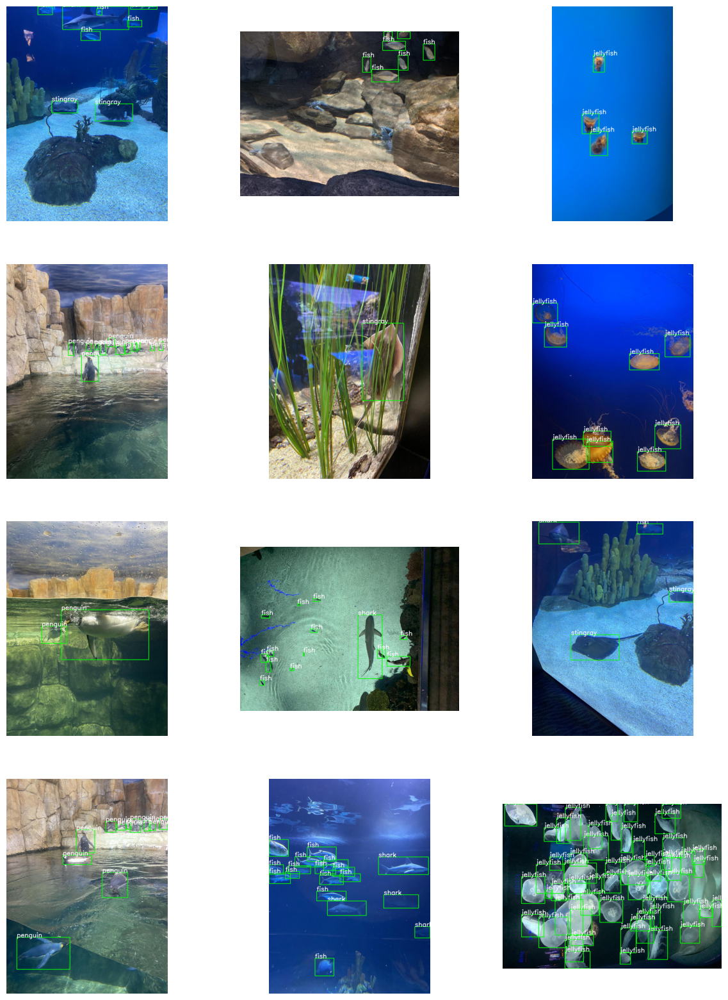

In [ ]:
def visualize_image_with_annotation_bboxes(image_dir, label_dir):
    # Get list of all the image files in the directory and choose 10 random image files from the list
    image_files = sorted(os.listdir(image_dir))
    sample_image_files = random.sample(image_files, 12)
    fig, axs = plt.subplots(4, 3, figsize=(15, 20))

    # Loop over the random images and plot the bounding boxes
    for i, image_file in enumerate(sample_image_files):
        row = i // 3
        col = i % 3
        image_path = os.path.join(image_dir, image_file)
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        label_path = os.path.join(label_dir, image_file[:-4] + ".txt")
        f = open(label_path, "r")
        for label in f:
            class_id, x_center, y_center, width, height = map(float, label.split())
            h, w, _ = image.shape
            x_min = int((x_center - width / 2) * w)
            y_min = int((y_center - height / 2) * h)
            x_max = int((x_center + width / 2) * w)
            y_max = int((y_center + height / 2) * h)
            cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
            cv2.putText(
                image,
                Idx2Label[int(class_id)],
                (x_min, y_min),
                cv2.FONT_HERSHEY_SIMPLEX,
                fontScale=1,
                color=(255, 255, 255),
                thickness=2,
            )

        axs[row, col].imshow(image)
        axs[row, col].axis("off")

    plt.show()


visualize_image_with_annotation_bboxes(train_images, train_labels)


In [ ]:
# Read an image by path
image_path = os.path.join(train_images, os.listdir(train_images)[100])
image = cv2.imread(image_path)

# Get the size of the image
height, width, channels = image.shape
print("The image has dimensions {}x{} and {} channels".format(height, width, channels))


The image has dimensions 1024x768 and 3 channels


In [5]:
%%writefile /content/data.yaml
# Path
train: /content/aquarium_pretrain/train/images
val: /content/aquarium_pretrain/valid/images
test: /content/aquarium_pretrain/test/images

# Classes
nc: 7
names: ["fish", "jellyfish", "penguin", "puffin", "shark", "starfish", "stingray"]


Writing /content/data.yaml


## Model training
Train mode is used for training a YOLOv8 model on a custom dataset (fish).  
We train the model over 100 epochs for a better accuracy.  
The seed is fixed for accuracy.  
We are using 80% of the available GPU memory ~~and loading training images directly onto the RAM for faster training~~ *we would have loved todo this but it crashes Colab so we cache them onto a specific part of the disk now*.  
We are also saving some graphs for further analysis and we validate the model after each epoch.

In [ ]:
# Load a pretrained nano model
model = YOLO("yolov8n.pt")

# free up GPU memory
torch.cuda.empty_cache()
import gc

gc.collect()

# Training the model
results = model.train(
    data="/content/data.yaml",
    epochs=100,
    imgsz=(height, width, channels),
    seed=42,
    batch=0.7,
    workers=6,
    cache="disk",
    device=device,
    name="yolov8n_custom",
    exist_ok=True,
    val=True,
    plots=True,
    save=True,
)


100%|██████████| 6.25M/6.25M [00:00<00:00, 98.0MB/s]


Ultralytics YOLOv8.2.101 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/data.yaml, epochs=100, time=None, patience=100, batch=0.7, imgsz=(1024, 768, 3), save=True, save_period=-1, cache=disk, device=0, workers=6, project=None, name=yolov8n_custom, exist_ok=True, pretrained=True, optimizer=auto, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=

100%|██████████| 755k/755k [00:00<00:00, 24.1MB/s]


Overriding model.yaml nc=80 with nc=7

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /content/aquarium_pretrain/train/labels... 448 images, 1 backgrounds, 0 corrupt: 100%|██████████| 448/448 [00:00<00:00, 1746.95it/s]

train: New cache created: /content/aquarium_pretrain/train/labels.cache



train: Caching images (1.0GB Disk): 100%|██████████| 448/448 [00:03<00:00, 123.56it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/aquarium_pretrain/valid/labels... 127 images, 0 backgrounds, 0 corrupt: 100%|██████████| 127/127 [00:00<00:00, 1433.36it/s]

val: New cache created: /content/aquarium_pretrain/valid/labels.cache



val: Caching images (0.3GB Disk): 100%|██████████| 127/127 [00:02<00:00, 58.16it/s]


Plotting labels to runs/detect/yolov8n_custom/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000909, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.000546875), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 1024 train, 1024 val
Using 2 dataloader workers
Logging results to runs/detect/yolov8n_custom
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100        13G      1.461      4.108      1.409        327       1024: 100%|██████████| 13/13 [00:19<00:00,  1.52s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.65s/it]

                   all        127        909     0.0247      0.509     0.0546     0.0312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      13.1G      1.522       3.08      1.338        389       1024: 100%|██████████| 13/13 [00:15<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.64s/it]


                   all        127        909     0.0185        0.7      0.125     0.0706

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      12.8G      1.466      2.557      1.299        237       1024: 100%|██████████| 13/13 [00:14<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.63s/it]

                   all        127        909      0.488      0.133      0.225      0.129



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      12.9G      1.436      2.184      1.294        521       1024: 100%|██████████| 13/13 [00:15<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.82s/it]

                   all        127        909      0.619      0.108      0.251      0.145



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      13.1G      1.432      2.069      1.303        266       1024: 100%|██████████| 13/13 [00:14<00:00,  1.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.78s/it]

                   all        127        909      0.454      0.259      0.285      0.173



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      12.6G      1.447      1.932       1.29        635       1024: 100%|██████████| 13/13 [00:15<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.35s/it]

                   all        127        909      0.501      0.278      0.321      0.193



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      13.9G      1.387      1.775      1.256        361       1024: 100%|██████████| 13/13 [00:14<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:05<00:00,  2.57s/it]

                   all        127        909      0.432       0.34      0.364      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      12.9G       1.39      1.747      1.267        357       1024: 100%|██████████| 13/13 [00:15<00:00,  1.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.55s/it]

                   all        127        909       0.49      0.293      0.315      0.174



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100        13G      1.443      1.721      1.283        426       1024: 100%|██████████| 13/13 [00:15<00:00,  1.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.12s/it]

                   all        127        909      0.379      0.372      0.317      0.168



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      13.7G      1.381      1.664      1.274        371       1024: 100%|██████████| 13/13 [00:13<00:00,  1.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.43s/it]

                   all        127        909      0.527      0.424      0.476      0.274



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      13.2G       1.35      1.561      1.234        187       1024: 100%|██████████| 13/13 [00:16<00:00,  1.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.55s/it]

                   all        127        909      0.562      0.444       0.47      0.269



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      12.1G      1.366      1.524      1.236        409       1024: 100%|██████████| 13/13 [00:15<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.60s/it]

                   all        127        909      0.491      0.456      0.458      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      13.8G      1.341      1.445      1.214        376       1024: 100%|██████████| 13/13 [00:15<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.97s/it]

                   all        127        909      0.588      0.497      0.489      0.272



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      14.2G      1.333      1.407      1.211        252       1024: 100%|██████████| 13/13 [00:14<00:00,  1.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.00s/it]

                   all        127        909       0.54      0.521      0.508      0.288



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      12.1G      1.312      1.434      1.216        385       1024: 100%|██████████| 13/13 [00:15<00:00,  1.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.47s/it]

                   all        127        909      0.586      0.517      0.519       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      13.7G      1.325      1.393      1.208        337       1024: 100%|██████████| 13/13 [00:14<00:00,  1.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.55s/it]

                   all        127        909      0.625       0.55       0.56      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      12.4G      1.273      1.329      1.188        319       1024: 100%|██████████| 13/13 [00:15<00:00,  1.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.67s/it]

                   all        127        909      0.655      0.529      0.584      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      13.8G      1.298      1.273      1.204        372       1024: 100%|██████████| 13/13 [00:14<00:00,  1.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.44s/it]

                   all        127        909      0.612      0.591      0.615      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      12.1G      1.247      1.235      1.188        338       1024: 100%|██████████| 13/13 [00:15<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.37s/it]

                   all        127        909      0.667      0.562       0.61      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      12.5G      1.233      1.182      1.156        479       1024: 100%|██████████| 13/13 [00:15<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.23s/it]

                   all        127        909      0.739      0.585      0.657      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      13.1G      1.255      1.154      1.168        470       1024: 100%|██████████| 13/13 [00:14<00:00,  1.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.88s/it]

                   all        127        909      0.764      0.579      0.664      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      12.8G       1.22      1.136      1.155        370       1024: 100%|██████████| 13/13 [00:16<00:00,  1.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.52s/it]

                   all        127        909      0.687      0.599      0.657      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      13.2G      1.221      1.086      1.162        273       1024: 100%|██████████| 13/13 [00:15<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.42s/it]

                   all        127        909      0.692      0.643      0.633      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      12.7G      1.211      1.099      1.161        445       1024: 100%|██████████| 13/13 [00:15<00:00,  1.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.40s/it]

                   all        127        909       0.69      0.615      0.644      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      12.4G      1.205      1.082      1.155        252       1024: 100%|██████████| 13/13 [00:13<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.85s/it]

                   all        127        909      0.629      0.631      0.616      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      12.3G       1.22      1.073      1.173        320       1024: 100%|██████████| 13/13 [00:16<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.22s/it]

                   all        127        909      0.678      0.601      0.643      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      13.1G      1.212      1.069      1.167        291       1024: 100%|██████████| 13/13 [00:15<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.38s/it]

                   all        127        909      0.755      0.558      0.641      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      12.6G      1.195       1.04      1.156        354       1024: 100%|██████████| 13/13 [00:15<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.51s/it]

                   all        127        909      0.689      0.638      0.651      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      12.8G      1.216      1.052      1.151        217       1024: 100%|██████████| 13/13 [00:15<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.50s/it]

                   all        127        909      0.641      0.431      0.484      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      13.2G      1.175      1.013      1.146        387       1024: 100%|██████████| 13/13 [00:15<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.15s/it]

                   all        127        909      0.642      0.492      0.501      0.288



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      12.8G      1.174      0.981      1.123        300       1024: 100%|██████████| 13/13 [00:15<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.25s/it]

                   all        127        909      0.655       0.56       0.57      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      14.2G      1.175     0.9825      1.146        250       1024: 100%|██████████| 13/13 [00:15<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.65s/it]

                   all        127        909      0.725      0.603      0.655      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      12.7G      1.183     0.9639      1.125        330       1024: 100%|██████████| 13/13 [00:14<00:00,  1.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.56s/it]

                   all        127        909       0.69      0.625      0.656      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      12.5G      1.146     0.9371      1.138        305       1024: 100%|██████████| 13/13 [00:16<00:00,  1.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all        127        909      0.699      0.684      0.704      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      12.2G      1.146     0.9236      1.115        393       1024: 100%|██████████| 13/13 [00:15<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.18s/it]

                   all        127        909      0.686       0.61      0.654      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      13.7G      1.177     0.9247       1.13        416       1024: 100%|██████████| 13/13 [00:15<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.75s/it]

                   all        127        909      0.746      0.591       0.66      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      14.3G       1.13     0.9036      1.111        415       1024: 100%|██████████| 13/13 [00:14<00:00,  1.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.69s/it]

                   all        127        909      0.717      0.668      0.701      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      13.8G      1.114     0.8675      1.102        286       1024: 100%|██████████| 13/13 [00:15<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.13s/it]

                   all        127        909      0.766      0.608      0.665      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      13.2G      1.164     0.9003      1.125        269       1024: 100%|██████████| 13/13 [00:15<00:00,  1.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.19s/it]

                   all        127        909      0.792      0.554      0.666      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      13.2G      1.131      0.881      1.115        319       1024: 100%|██████████| 13/13 [00:14<00:00,  1.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.51s/it]

                   all        127        909      0.704      0.652      0.685      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      13.3G      1.112     0.8688       1.09        347       1024: 100%|██████████| 13/13 [00:14<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.76s/it]

                   all        127        909      0.745      0.569      0.688      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      12.5G      1.117     0.8447      1.097        432       1024: 100%|██████████| 13/13 [00:16<00:00,  1.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.25s/it]

                   all        127        909      0.771      0.591       0.67      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      14.4G      1.104     0.8337      1.093        386       1024: 100%|██████████| 13/13 [00:15<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.25s/it]

                   all        127        909      0.707      0.683      0.691      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      13.8G      1.097     0.8383      1.096        278       1024: 100%|██████████| 13/13 [00:15<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.75s/it]

                   all        127        909      0.772      0.647        0.7      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      13.9G      1.103     0.8422      1.102        281       1024: 100%|██████████| 13/13 [00:16<00:00,  1.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.23s/it]

                   all        127        909      0.757      0.652      0.713      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      14.2G      1.095     0.8206      1.083        439       1024: 100%|██████████| 13/13 [00:15<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.35s/it]

                   all        127        909       0.79      0.641      0.697      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      13.1G      1.075     0.8123      1.081        364       1024: 100%|██████████| 13/13 [00:14<00:00,  1.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.17s/it]

                   all        127        909      0.767      0.662      0.719      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      13.6G      1.053     0.7818      1.079        362       1024: 100%|██████████| 13/13 [00:15<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.75s/it]

                   all        127        909      0.784      0.637      0.725      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100        13G      1.065     0.7914      1.077        392       1024: 100%|██████████| 13/13 [00:15<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.10s/it]

                   all        127        909        0.8      0.681       0.73      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      13.1G      1.061     0.7781      1.078        307       1024: 100%|██████████| 13/13 [00:15<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.36s/it]

                   all        127        909      0.763      0.692      0.737      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      13.9G      1.066     0.7842       1.08        330       1024: 100%|██████████| 13/13 [00:14<00:00,  1.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.30s/it]

                   all        127        909      0.715      0.656        0.7      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      13.5G      1.036     0.7786       1.07        259       1024: 100%|██████████| 13/13 [00:14<00:00,  1.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.78s/it]

                   all        127        909      0.813      0.692      0.758      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      14.1G      1.027     0.7445      1.056        361       1024: 100%|██████████| 13/13 [00:15<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.31s/it]

                   all        127        909      0.786      0.713      0.755      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100        13G      1.021     0.7474      1.061        356       1024: 100%|██████████| 13/13 [00:15<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.18s/it]

                   all        127        909      0.755      0.665      0.727      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      12.3G      1.026     0.7345      1.059        350       1024: 100%|██████████| 13/13 [00:15<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.14s/it]

                   all        127        909      0.796      0.643      0.716      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      12.7G      1.008      0.722      1.051        294       1024: 100%|██████████| 13/13 [00:15<00:00,  1.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.64s/it]

                   all        127        909      0.714      0.694      0.716      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      12.8G      1.062     0.7291      1.066        401       1024: 100%|██████████| 13/13 [00:15<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.15s/it]

                   all        127        909      0.715      0.657      0.695      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      14.6G     0.9927     0.7176      1.041        431       1024: 100%|██████████| 13/13 [00:15<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.19s/it]

                   all        127        909      0.806      0.652      0.721      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      12.9G     0.9938     0.7064      1.051        383       1024: 100%|██████████| 13/13 [00:15<00:00,  1.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.54s/it]

                   all        127        909      0.748      0.713      0.738      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      14.2G      1.003     0.7092       1.05        516       1024: 100%|██████████| 13/13 [00:15<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.70s/it]

                   all        127        909       0.78      0.679      0.728      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      13.4G      1.015     0.7164      1.054        359       1024: 100%|██████████| 13/13 [00:15<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.39s/it]

                   all        127        909      0.801      0.663      0.734      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      13.4G      1.019      0.716      1.037        408       1024: 100%|██████████| 13/13 [00:15<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.22s/it]

                   all        127        909      0.776      0.686      0.746      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      12.8G      0.955     0.6721      1.035        299       1024: 100%|██████████| 13/13 [00:15<00:00,  1.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.40s/it]

                   all        127        909      0.799      0.686      0.734      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      12.9G     0.9792     0.6968      1.044        274       1024: 100%|██████████| 13/13 [00:14<00:00,  1.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.56s/it]

                   all        127        909      0.755      0.696      0.731      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      13.8G     0.9909     0.6927      1.038        308       1024: 100%|██████████| 13/13 [00:16<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.30s/it]

                   all        127        909      0.759      0.697      0.736      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      14.1G     0.9561     0.6655      1.025        331       1024: 100%|██████████| 13/13 [00:14<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.19s/it]

                   all        127        909      0.804      0.695      0.732      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      12.6G     0.9547     0.6634      1.023        294       1024: 100%|██████████| 13/13 [00:15<00:00,  1.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.48s/it]

                   all        127        909      0.807       0.68      0.744      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      12.7G     0.9516     0.6612      1.028        308       1024: 100%|██████████| 13/13 [00:14<00:00,  1.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.34s/it]

                   all        127        909      0.769      0.693      0.735      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      12.3G     0.9482     0.6579      1.039        308       1024: 100%|██████████| 13/13 [00:15<00:00,  1.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.11s/it]

                   all        127        909      0.796      0.662      0.727      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      13.9G     0.9676     0.6669      1.028        379       1024: 100%|██████████| 13/13 [00:15<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.32s/it]

                   all        127        909      0.766      0.684      0.731      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      13.5G     0.9425     0.6419      1.014        371       1024: 100%|██████████| 13/13 [00:14<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.57s/it]

                   all        127        909      0.765      0.678      0.729      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      12.4G     0.9524     0.6553      1.022        409       1024: 100%|██████████| 13/13 [00:16<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.23s/it]

                   all        127        909      0.818      0.661      0.728      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      13.5G     0.9329     0.6312      1.014        297       1024: 100%|██████████| 13/13 [00:15<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.52s/it]

                   all        127        909      0.812      0.673      0.731      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      12.5G      0.934     0.6281      1.015        295       1024: 100%|██████████| 13/13 [00:15<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.70s/it]

                   all        127        909      0.794      0.688      0.724      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      14.6G     0.9382     0.6297      1.019        336       1024: 100%|██████████| 13/13 [00:16<00:00,  1.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.26s/it]

                   all        127        909        0.8      0.675       0.73       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      13.1G     0.9044     0.6093      1.012        327       1024: 100%|██████████| 13/13 [00:15<00:00,  1.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.21s/it]

                   all        127        909      0.779      0.702      0.736      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      14.3G     0.9071     0.6289      1.005        380       1024: 100%|██████████| 13/13 [00:15<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.61s/it]

                   all        127        909      0.784      0.712      0.741      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      14.2G     0.9006      0.612      1.006        378       1024: 100%|██████████| 13/13 [00:14<00:00,  1.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.70s/it]

                   all        127        909      0.805      0.691      0.748       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      14.1G     0.9215     0.6187     0.9986        419       1024: 100%|██████████| 13/13 [00:16<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.27s/it]

                   all        127        909      0.834      0.679      0.756      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      12.6G     0.9266     0.6325      1.008        328       1024: 100%|██████████| 13/13 [00:15<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.18s/it]

                   all        127        909      0.813      0.696      0.752      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      12.7G      0.909     0.6112     0.9967        326       1024: 100%|██████████| 13/13 [00:15<00:00,  1.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.58s/it]

                   all        127        909      0.817      0.675      0.741       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      13.6G     0.8758      0.594     0.9959        472       1024: 100%|██████████| 13/13 [00:15<00:00,  1.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.24s/it]

                   all        127        909      0.806      0.675      0.742      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      12.4G     0.8994     0.6021      1.004        362       1024: 100%|██████████| 13/13 [00:15<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.19s/it]

                   all        127        909      0.772      0.687      0.743      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      12.5G     0.8861     0.6034     0.9895        373       1024: 100%|██████████| 13/13 [00:15<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.66s/it]

                   all        127        909      0.841       0.65       0.75      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      12.8G     0.8748     0.5861     0.9873        305       1024: 100%|██████████| 13/13 [00:16<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.13s/it]

                   all        127        909      0.824      0.676       0.75      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      13.9G     0.8777     0.5938     0.9849        319       1024: 100%|██████████| 13/13 [00:14<00:00,  1.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.58s/it]

                   all        127        909      0.803      0.697       0.75      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      12.8G     0.8631      0.598          1        423       1024: 100%|██████████| 13/13 [00:15<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.45s/it]

                   all        127        909      0.802        0.7      0.748      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      13.1G      0.869     0.5854     0.9929        332       1024: 100%|██████████| 13/13 [00:16<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.05s/it]

                   all        127        909      0.806      0.691      0.742      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      12.9G      0.853     0.5841     0.9898        271       1024: 100%|██████████| 13/13 [00:15<00:00,  1.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.14s/it]

                   all        127        909      0.801      0.694      0.747      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      14.3G     0.8642     0.5726     0.9908        257       1024: 100%|██████████| 13/13 [00:16<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.52s/it]

                   all        127        909      0.792      0.697      0.753       0.47


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      12.2G       0.88     0.6079     0.9863        172       1024: 100%|██████████| 13/13 [00:19<00:00,  1.47s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.60s/it]

                   all        127        909      0.781      0.677      0.726      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      12.1G     0.8494     0.5709     0.9754        209       1024: 100%|██████████| 13/13 [00:15<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.14s/it]

                   all        127        909      0.753      0.674       0.71      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      12.9G     0.8316     0.5417      0.966        219       1024: 100%|██████████| 13/13 [00:14<00:00,  1.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.21s/it]

                   all        127        909      0.791      0.687      0.732      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      13.1G     0.8092     0.5203     0.9632        138       1024: 100%|██████████| 13/13 [00:14<00:00,  1.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.13s/it]

                   all        127        909      0.799      0.681      0.739      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      12.9G     0.8101     0.5237     0.9658        233       1024: 100%|██████████| 13/13 [00:13<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.60s/it]

                   all        127        909      0.772      0.707       0.74      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      12.9G      0.794     0.5097     0.9531        188       1024: 100%|██████████| 13/13 [00:14<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.34s/it]

                   all        127        909      0.808      0.683      0.742      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      12.5G     0.8083      0.519     0.9548        214       1024: 100%|██████████| 13/13 [00:15<00:00,  1.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.32s/it]

                   all        127        909      0.776      0.709      0.749      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      13.2G      0.794     0.5165     0.9543        163       1024: 100%|██████████| 13/13 [00:14<00:00,  1.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.32s/it]

                   all        127        909       0.77      0.719      0.752      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      12.2G     0.7821     0.5052     0.9388        239       1024: 100%|██████████| 13/13 [00:14<00:00,  1.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.38s/it]

                   all        127        909      0.774       0.72      0.754       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      11.9G     0.7818     0.5051      0.949        232       1024: 100%|██████████| 13/13 [00:13<00:00,  1.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.64s/it]

                   all        127        909      0.778      0.718      0.755       0.46



100 epochs completed in 0.571 hours.
Optimizer stripped from runs/detect/yolov8n_custom/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/yolov8n_custom/weights/best.pt, 6.3MB

Validating runs/detect/yolov8n_custom/weights/best.pt...
Ultralytics YOLOv8.2.101 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,007,013 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.36s/it]


                   all        127        909      0.793      0.698      0.754      0.469
                  fish         63        459      0.839       0.76      0.826      0.471
             jellyfish          9        155       0.87      0.852      0.913      0.548
               penguin         17        104      0.695      0.746        0.7      0.343
                puffin         15         74      0.708      0.459       0.56      0.313
                 shark         28         57      0.805      0.649        0.7      0.442
              starfish         17         27      0.855       0.63      0.777      0.571
              stingray         23         33      0.778      0.788        0.8      0.597
Speed: 0.4ms preprocess, 5.2ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to runs/detect/yolov8n_custom


In [ ]:
# Clear memory because Colab is dying at this point
torch.cuda.empty_cache()
gc.collect()


10

## Model performance
- **Train Box Loss** : measures the difference between the predicted bounding boxes and the actual bounding boxes of the objects in the training data.
- **Train Class Loss** : measures the difference between the predicted class probabilities and the actual class labels of the objects in the training data.
- **Train DFL (Dynamic Feature Learning) Loss** : measures the difference between the predicted feature maps and the actual feature maps of the objects in the training data.
- **Metrics Precision (B)** : measures the proportion of true positive detections among all the predicted bounding boxes.
- **Metrics Recall (B)** : metric measures the proportion of true positive detections among all the actual bounding boxes.
- **Metrics mAP50 (B)** : measures the mean average precision of the model across different object categories, with a 50% intersection-over-union (IoU) threshold.
- **Metrics mAP50-95 (B)** : measures the mean average precision of the model across different object categories, with IoU thresholds ranging from 50% to 95%.

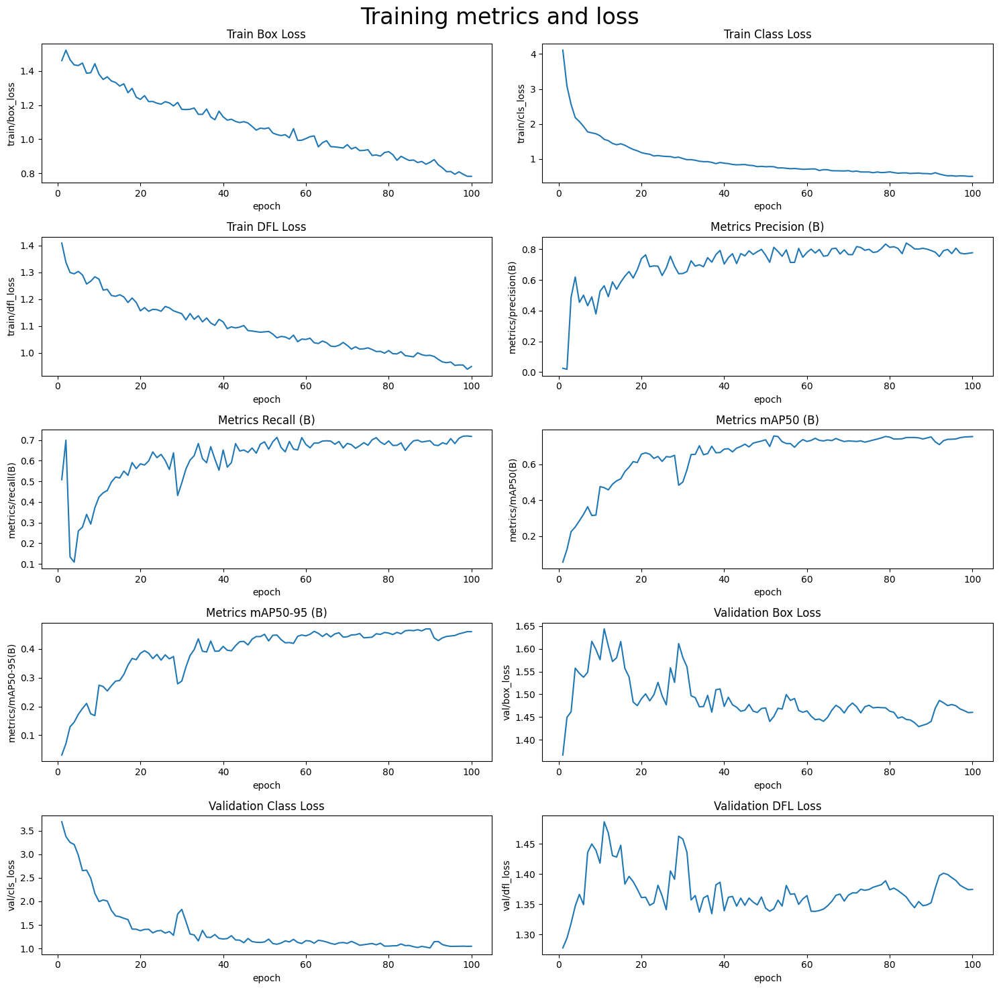

In [ ]:
%matplotlib inline
df = pd.read_csv("/content/runs/detect/yolov8n_custom/results.csv")
df.columns = df.columns.str.strip()

fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# plot the columns using seaborn
sns.lineplot(x="epoch", y="train/box_loss", data=df, ax=axs[0, 0])
sns.lineplot(x="epoch", y="train/cls_loss", data=df, ax=axs[0, 1])
sns.lineplot(x="epoch", y="train/dfl_loss", data=df, ax=axs[1, 0])
sns.lineplot(x="epoch", y="metrics/precision(B)", data=df, ax=axs[1, 1])
sns.lineplot(x="epoch", y="metrics/recall(B)", data=df, ax=axs[2, 0])
sns.lineplot(x="epoch", y="metrics/mAP50(B)", data=df, ax=axs[2, 1])
sns.lineplot(x="epoch", y="metrics/mAP50-95(B)", data=df, ax=axs[3, 0])
sns.lineplot(x="epoch", y="val/box_loss", data=df, ax=axs[3, 1])
sns.lineplot(x="epoch", y="val/cls_loss", data=df, ax=axs[4, 0])
sns.lineplot(x="epoch", y="val/dfl_loss", data=df, ax=axs[4, 1])

# set titles and axis labels for each subplot
axs[0, 0].set(title="Train Box Loss")
axs[0, 1].set(title="Train Class Loss")
axs[1, 0].set(title="Train DFL Loss")
axs[1, 1].set(title="Metrics Precision (B)")
axs[2, 0].set(title="Metrics Recall (B)")
axs[2, 1].set(title="Metrics mAP50 (B)")
axs[3, 0].set(title="Metrics mAP50-95 (B)")
axs[3, 1].set(title="Validation Box Loss")
axs[4, 0].set(title="Validation Class Loss")
axs[4, 1].set(title="Validation DFL Loss")

plt.suptitle("Training metrics and loss", fontsize=24)

# adjust top margin to make space for suptitle
plt.subplots_adjust(top=0.8)

# adjust spacing between subplots
plt.tight_layout()

plt.show()


## Evaluation
Once the model is trained, we evaluate its performance on the test dataset. The evaluation includes metrics such as mean Average Precision (mAP) at different IoU thresholds (0.5, 0.7, 0.95).

In [ ]:
# Loading the best performing model
model = YOLO("/content/runs/detect/yolov8n_custom/weights/best.pt")

# Evaluating the model on test dataset
metrics = model.val(
    conf=0.25, split="test", save_json=True, save_hybrid=True, device=device, plots=True
)


WARNING ⚠️ 'save_hybrid=True' will append ground truth to predictions for autolabelling.
WARNING ⚠️ 'save_hybrid=True' will cause incorrect mAP.

Ultralytics YOLOv8.2.101 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,007,013 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/aquarium_pretrain/test/labels... 63 images, 0 backgrounds, 0 corrupt: 100%|██████████| 63/63 [00:00<00:00, 360.09it/s]

val: New cache created: /content/aquarium_pretrain/test/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:10<00:00,  2.61s/it]


                   all         63        584      0.992      0.992      0.986      0.986
                  fish         30        249          1          1      0.995      0.995
             jellyfish         11        154          1          1      0.995      0.995
               penguin          7         82          1          1      0.995      0.995
                puffin          6         35          1          1      0.995      0.995
                 shark         14         38      0.947      0.947      0.935      0.935
              starfish          5         11          1          1      0.995      0.995
              stingray         10         15          1          1      0.995      0.995
Speed: 1.2ms preprocess, 19.2ms inference, 0.0ms loss, 6.3ms postprocess per image
Saving runs/detect/val/predictions.json...
Results saved to runs/detect/val


The results from the evaluation help us understand how well the model generalizes to unseen data. Here are the key evaluation metrics :
- **Mean Average Precision @ .50** : Measures how precise the model is with an IoU threshold of 50%.
- **Mean Average Precision @ .75** : The model's precision with an IoU threshold of 75%.
- **Mean Average Precision @ .95** : The most stringent evaluation metric with a threshold of 95%.

In [ ]:
print(f"Mean Average Precision @.5:.95 : {metrics.box.map}")
print(f"Mean Average Precision @ .50   : {metrics.box.map50}")
print(f"Mean Average Precision @ .70   : {metrics.box.map75}")


Mean Average Precision @.5:.95 : 0.9864632777596167
Mean Average Precision @ .50   : 0.9864632777596165
Mean Average Precision @ .70   : 0.9864632777596165


## Making predictions on test images
To test the model on new images, we use the test set and visualize its predictions, including the predicted bounding boxes and class labels.


0: 1024x768 1 fish, 20 penguins, 77.1ms
Speed: 10.8ms preprocess, 77.1ms inference, 10.5ms postprocess per image at shape (1, 3, 1024, 768)

0: 1024x768 1 fish, 1 starfish, 34.1ms
Speed: 12.8ms preprocess, 34.1ms inference, 6.9ms postprocess per image at shape (1, 3, 1024, 768)

0: 1024x768 19 penguins, 19.6ms
Speed: 4.7ms preprocess, 19.6ms inference, 1.6ms postprocess per image at shape (1, 3, 1024, 768)

0: 768x1024 10 fishs, 1 shark, 1 stingray, 73.1ms
Speed: 15.8ms preprocess, 73.1ms inference, 1.7ms postprocess per image at shape (1, 3, 768, 1024)

0: 1024x768 12 jellyfishs, 26.7ms
Speed: 16.4ms preprocess, 26.7ms inference, 1.8ms postprocess per image at shape (1, 3, 1024, 768)

0: 1024x768 19 jellyfishs, 16.4ms
Speed: 6.0ms preprocess, 16.4ms inference, 1.7ms postprocess per image at shape (1, 3, 1024, 768)

0: 1024x768 16 fishs, 1 shark, 35.5ms
Speed: 3.8ms preprocess, 35.5ms inference, 19.7ms postprocess per image at shape (1, 3, 1024, 768)

0: 1024x768 1 fish, 1 starfish, 2

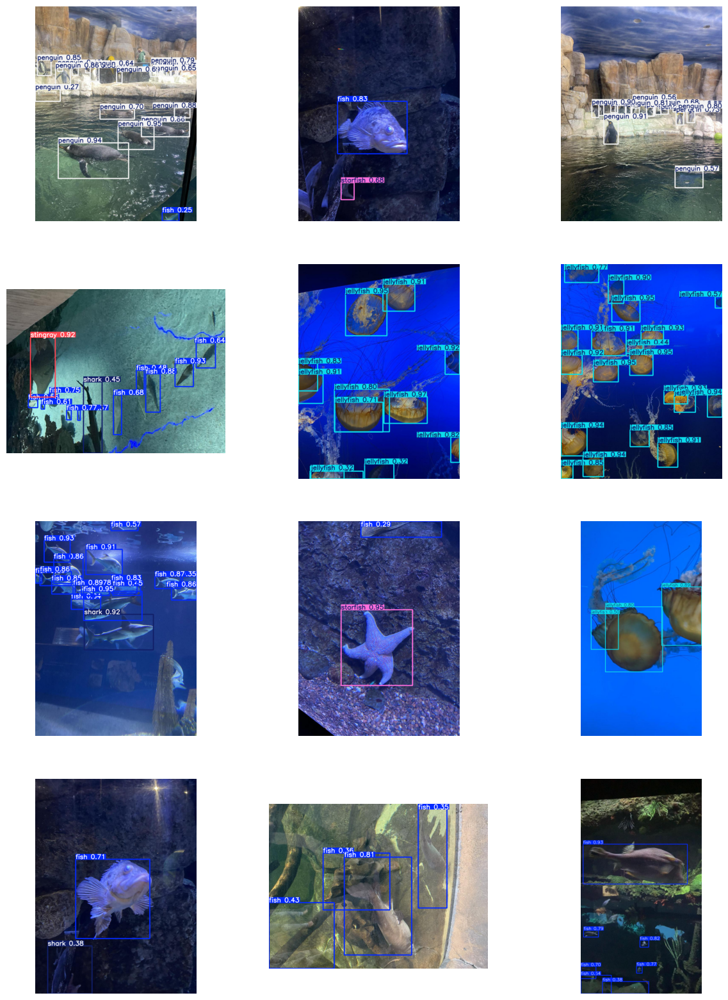

In [ ]:
# Function to perform detections with trained model
def predict_detection(image_path):
    image = cv2.imread(image_path)
    detect_result = model(image)
    detect_image = detect_result[0].plot()

    # Convert the image to RGB format
    detect_image = cv2.cvtColor(detect_image, cv2.COLOR_BGR2RGB)

    return detect_image


image_files = sorted(os.listdir(test_images))
sample_image_files = random.sample(image_files, 12)
fig, axs = plt.subplots(4, 3, figsize=(15, 20))

# Loop over the random images and plot the detections of the trained model
for i, image_file in enumerate(sample_image_files):
    row = i // 3
    col = i % 3

    image_path = os.path.join(test_images, image_file)
    detect_image = predict_detection(image_path)

    axs[row, col].imshow(detect_image)
    axs[row, col].axis("off")

plt.show()


## Making predictions on custom images
We create a function that allows the model to process images either from a local path or a URL. This function helps in verifying the model’s performance on arbitrary images.


image 1/1 d:\EDM115\Documents\IUT\AL5.A.01\tmp\temp_image.jpg: 608x1024 11 fishs, 2 jellyfishs, 123.5ms
Speed: 8.5ms preprocess, 123.5ms inference, 1.0ms postprocess per image at shape (1, 3, 608, 1024)


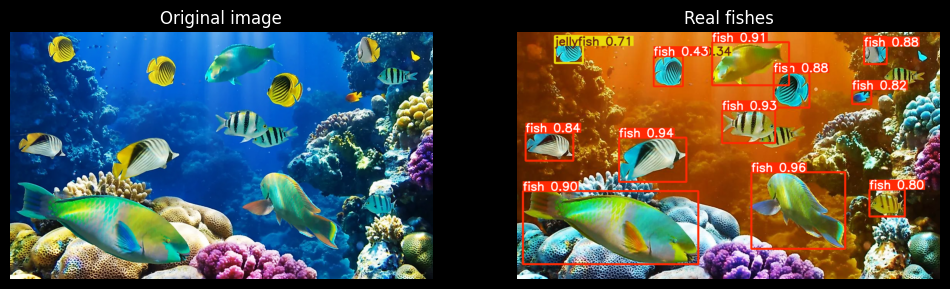


image 1/1 d:\EDM115\Documents\IUT\AL5.A.01\tmp\temp_image.jpg: 1024x1024 1 fish, 215.2ms
Speed: 10.0ms preprocess, 215.2ms inference, 1.0ms postprocess per image at shape (1, 3, 1024, 1024)


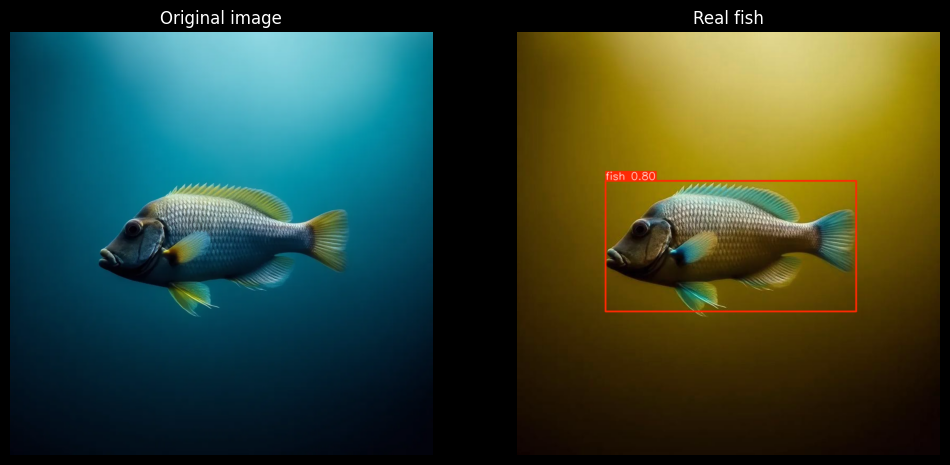


image 1/1 d:\EDM115\Documents\IUT\AL5.A.01\tmp\temp_image.jpg: 1024x1024 2 fishs, 2 jellyfishs, 2 sharks, 1 stingray, 227.1ms
Speed: 12.0ms preprocess, 227.1ms inference, 1.0ms postprocess per image at shape (1, 3, 1024, 1024)


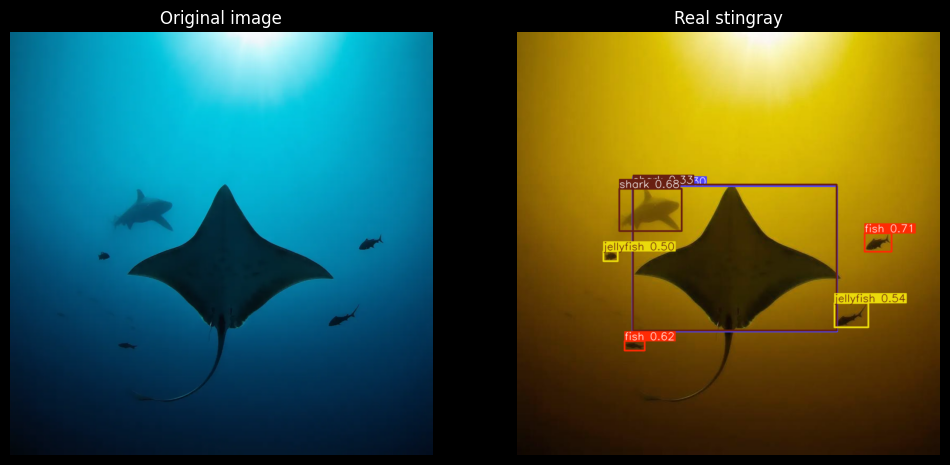


image 1/1 d:\EDM115\Documents\IUT\AL5.A.01\tmp\temp_image.jpg: 1024x1024 22 fishs, 1 jellyfish, 1 shark, 1 starfish, 196.1ms
Speed: 10.0ms preprocess, 196.1ms inference, 2.0ms postprocess per image at shape (1, 3, 1024, 1024)


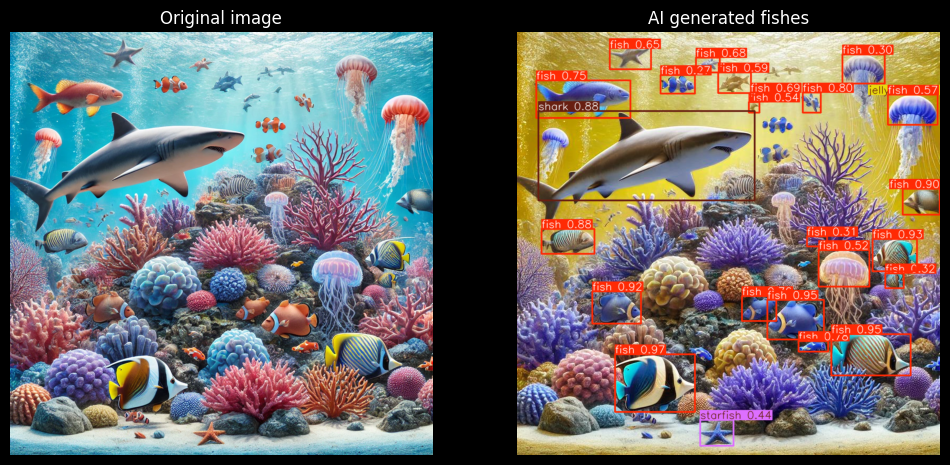


image 1/1 d:\EDM115\Documents\IUT\AL5.A.01\tmp\temp_image.jpg: 1024x1024 20 fishs, 4 jellyfishs, 1 starfish, 1 stingray, 217.1ms
Speed: 9.5ms preprocess, 217.1ms inference, 2.0ms postprocess per image at shape (1, 3, 1024, 1024)


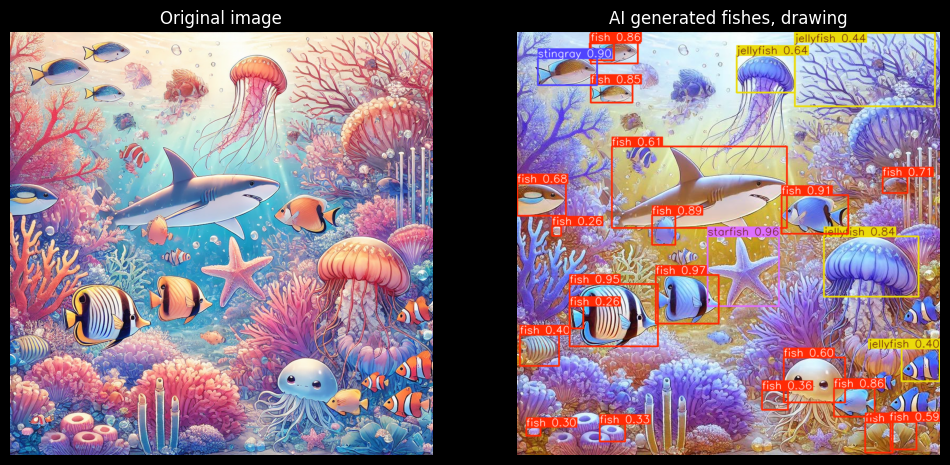


image 1/1 d:\EDM115\Documents\IUT\AL5.A.01\tmp\temp_image.jpg: 704x1024 6 fishs, 3 jellyfishs, 1 stingray, 167.6ms
Speed: 20.5ms preprocess, 167.6ms inference, 1.0ms postprocess per image at shape (1, 3, 704, 1024)


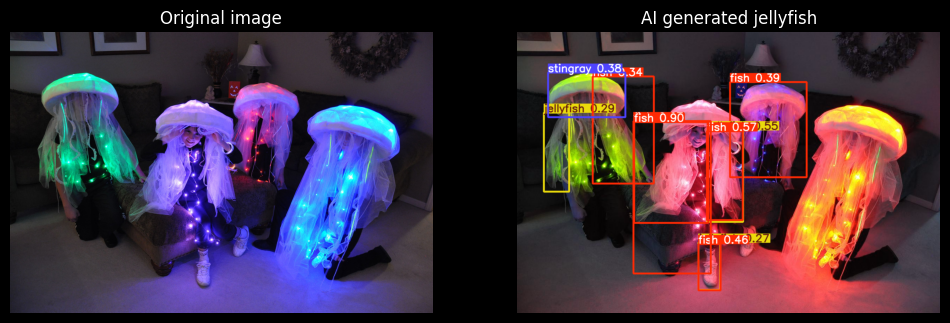


image 1/1 d:\EDM115\Documents\IUT\AL5.A.01\tmp\temp_image.jpg: 672x1024 3 jellyfishs, 1 shark, 140.6ms
Speed: 6.0ms preprocess, 140.6ms inference, 1.0ms postprocess per image at shape (1, 3, 672, 1024)


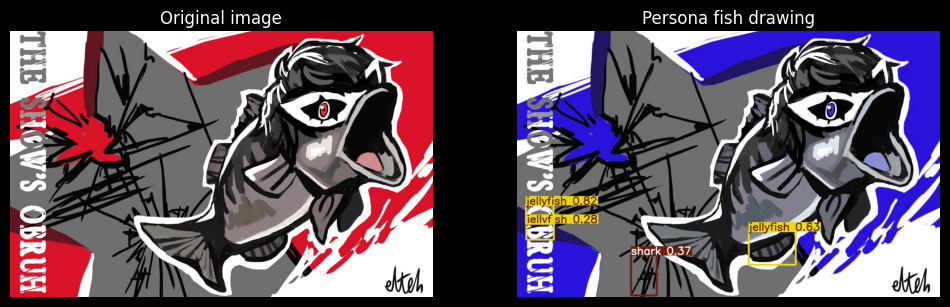


image 1/1 d:\EDM115\Documents\IUT\AL5.A.01\tmp\temp_image.jpg: 1024x768 (no detections), 168.1ms
Speed: 7.0ms preprocess, 168.1ms inference, 1.0ms postprocess per image at shape (1, 3, 1024, 768)


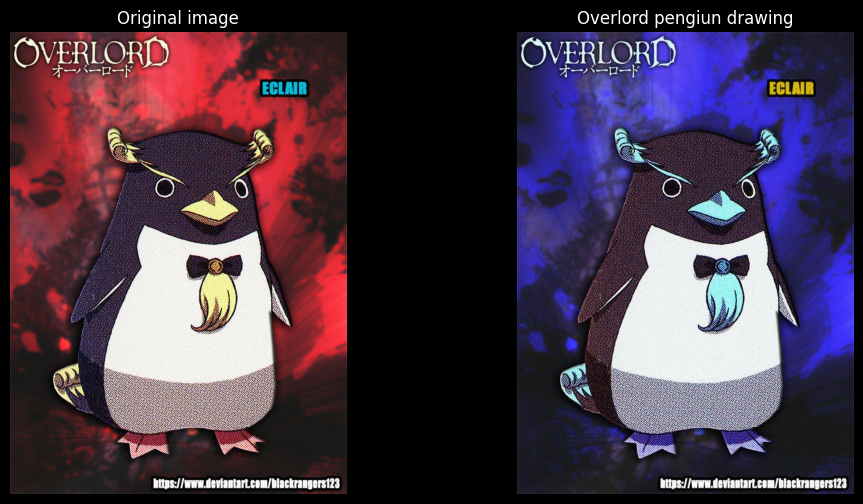

In [ ]:
def predict_from_path_or_url(input_image, title=None):
    """
    Function that takes an image path or URL, loads the image,
    and runs it through the YOLO model for predictions.
    """
    temp_image_path = None

    if input_image.startswith("http"):
        # Download image from URL
        response = requests.get(input_image, stream=True)
        image = Image.open(response.raw)
        temp_image_path = "/content/tmp/temp_image.jpg"
        os.makedirs(os.path.dirname(temp_image_path), exist_ok=True)
        if image.mode == "RGBA":
            image = image.convert("RGB")
        image.save(temp_image_path, "JPEG")
        image_path = temp_image_path
    else:
        # Use local image path
        image_path = input_image

    # Perform prediction using the trained model
    result = model(image_path)

    # Plot the result with bounding boxes
    detect_image = result[0].plot()

    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    axes[0].imshow(image)
    axes[0].axis("off")
    axes[0].set_title("Original image")
    axes[1].imshow(detect_image)
    axes[1].axis("off")
    if title:
        axes[1].set_title(title)
    plt.show()

    # Debug to see where it draw boxes
    # print(result)

    # If a temp file was used, delete it after use
    if temp_image_path and os.path.exists(temp_image_path):
        os.remove(temp_image_path)


# Real images
predict_from_path_or_url(
    "https://i.postimg.cc/B6nM6WD9/fish-species-tropical.png", "Real fishes"
)
predict_from_path_or_url("https://i.postimg.cc/k48JHH18/fishe.png", "Real fish")
predict_from_path_or_url("https://i.postimg.cc/Gms5v1Hk/stingray.png", "Real stingray")

# AI generated images
predict_from_path_or_url(
    "https://i.postimg.cc/26HwPH1k/fishes-ai-realistic.png", "AI generated fishes"
)
predict_from_path_or_url(
    "https://i.postimg.cc/nVCNYWSc/fishes-ai-drawing.png",
    "AI generated fishes, drawing",
)
predict_from_path_or_url(
    "https://i.postimg.cc/zfHRk8hF/fake-jellyfish.jpg", "AI generated jellyfish"
)

# Drawings
predict_from_path_or_url(
    "https://i.postimg.cc/g0hnZ49M/persona-fish.jpg", "Persona fish drawing"
)
predict_from_path_or_url(
    "https://i.postimg.cc/Dzc3Hb1v/overlord-penguin.png", "Overlord pengiun drawing"
)


## Further analysis
Let's analyze the model's performance more thoroughly by plotting additional graphs. We'll focus on deeper insights such as :
- **Training and Validation Loss over Epochs** : Visualize the convergence of the model.
- **Precision and Recall** : Compare the precision and recall over epochs to understand the model's trade-offs.
- **IoU Analysis** : Visualize the Intersection over Union (IoU) threshold performance

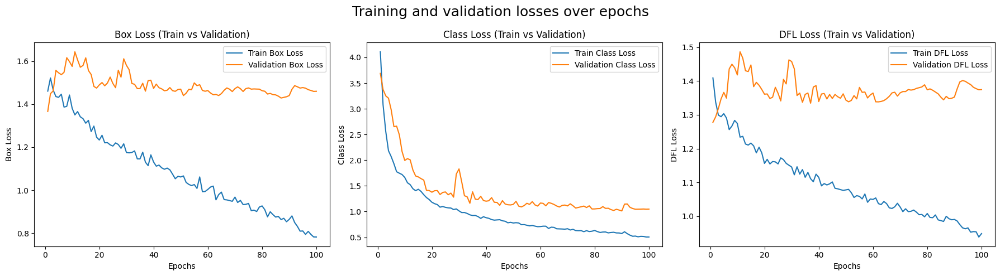

In [ ]:
# Plotting Training and Validation Losses
fig, ax = plt.subplots(1, 3, figsize=(18, 5))

# Training and validation box loss
sns.lineplot(x="epoch", y="train/box_loss", data=df, ax=ax[0], label="Train Box Loss")
sns.lineplot(
    x="epoch", y="val/box_loss", data=df, ax=ax[0], label="Validation Box Loss"
)
ax[0].set_title("Box Loss (Train vs Validation)")
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Box Loss")
ax[0].legend()

# Training and validation class loss
sns.lineplot(x="epoch", y="train/cls_loss", data=df, ax=ax[1], label="Train Class Loss")
sns.lineplot(
    x="epoch", y="val/cls_loss", data=df, ax=ax[1], label="Validation Class Loss"
)
ax[1].set_title("Class Loss (Train vs Validation)")
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Class Loss")
ax[1].legend()

# Training and validation DFL loss
sns.lineplot(x="epoch", y="train/dfl_loss", data=df, ax=ax[2], label="Train DFL Loss")
sns.lineplot(
    x="epoch", y="val/dfl_loss", data=df, ax=ax[2], label="Validation DFL Loss"
)
ax[2].set_title("DFL Loss (Train vs Validation)")
ax[2].set_xlabel("Epochs")
ax[2].set_ylabel("DFL Loss")
ax[2].legend()

plt.suptitle("Training and validation losses over epochs", fontsize=18)
plt.tight_layout()
plt.show()


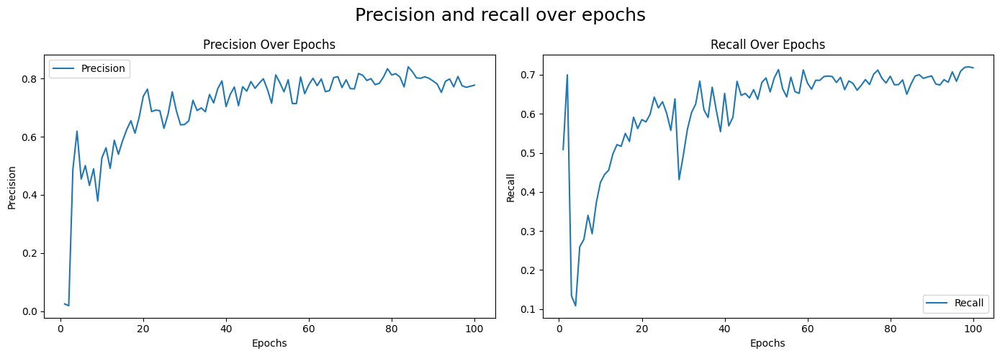

In [ ]:
# Precision and Recall over Epochs
fig, ax = plt.subplots(1, 2, figsize=(14, 5))

# Precision plot
sns.lineplot(x="epoch", y="metrics/precision(B)", data=df, ax=ax[0], label="Precision")
ax[0].set_title("Precision Over Epochs")
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Precision")
ax[0].legend()

# Recall plot
sns.lineplot(x="epoch", y="metrics/recall(B)", data=df, ax=ax[1], label="Recall")
ax[1].set_title("Recall Over Epochs")
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Recall")
ax[1].legend()

plt.suptitle("Precision and recall over epochs", fontsize=18)
plt.tight_layout()
plt.show()


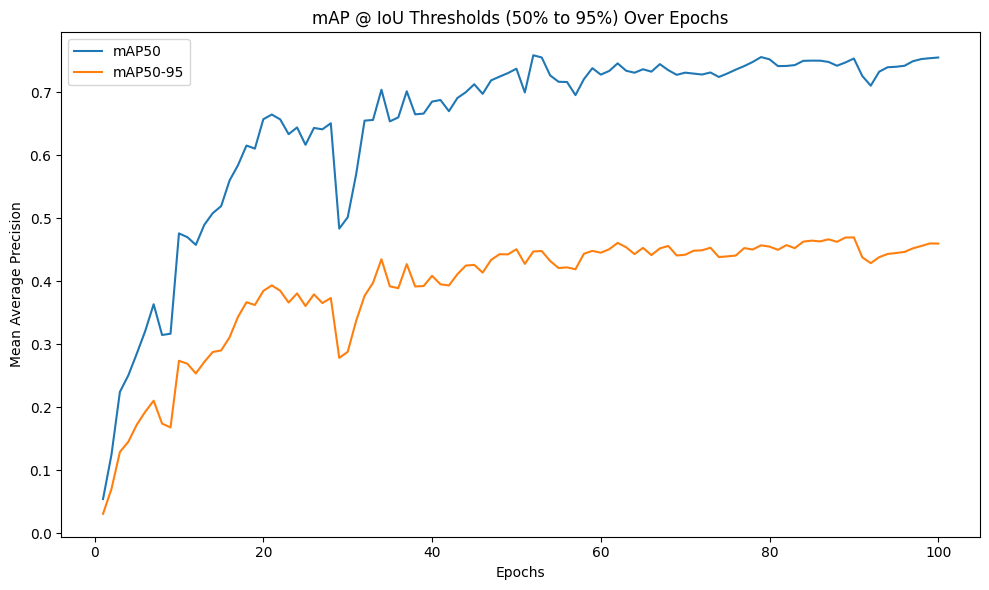

In [ ]:
# Plotting the IoU thresholds for mAP50 to mAP95
fig, ax = plt.subplots(figsize=(10, 6))

sns.lineplot(x="epoch", y="metrics/mAP50(B)", data=df, label="mAP50", ax=ax)
sns.lineplot(x="epoch", y="metrics/mAP50-95(B)", data=df, label="mAP50-95", ax=ax)
ax.set_title("mAP @ IoU Thresholds (50% to 95%) Over Epochs")
ax.set_xlabel("Epochs")
ax.set_ylabel("Mean Average Precision")
ax.legend()

plt.tight_layout()
plt.show()


## Data from YOLO
We finally display the graphs that YOLO generated during the training, validation and evaluation periods

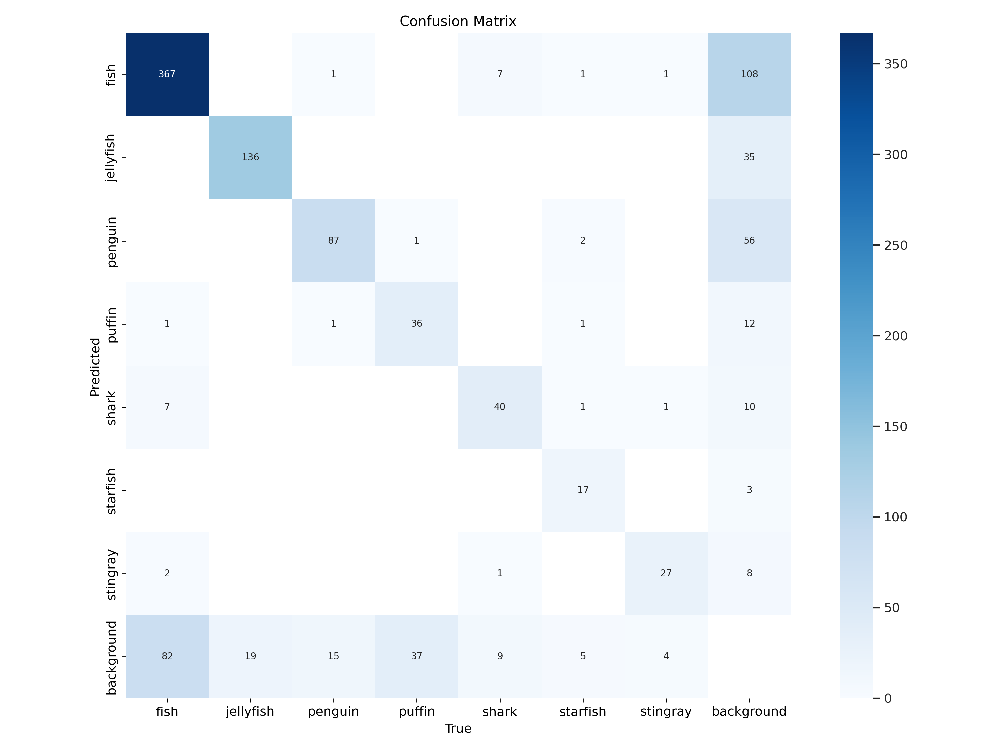

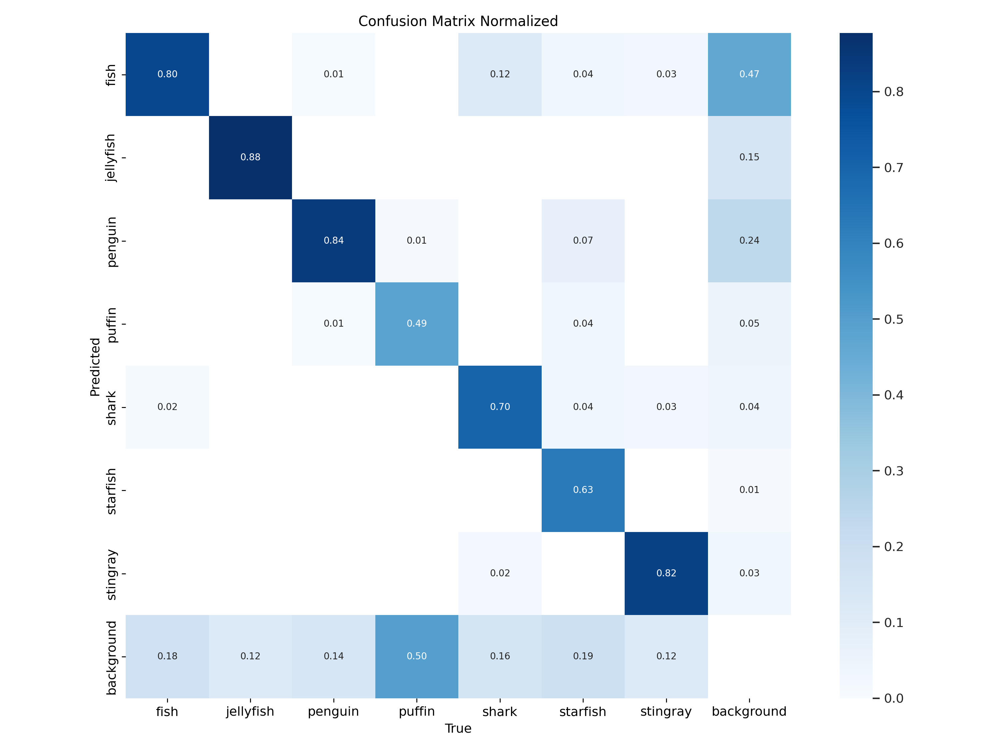

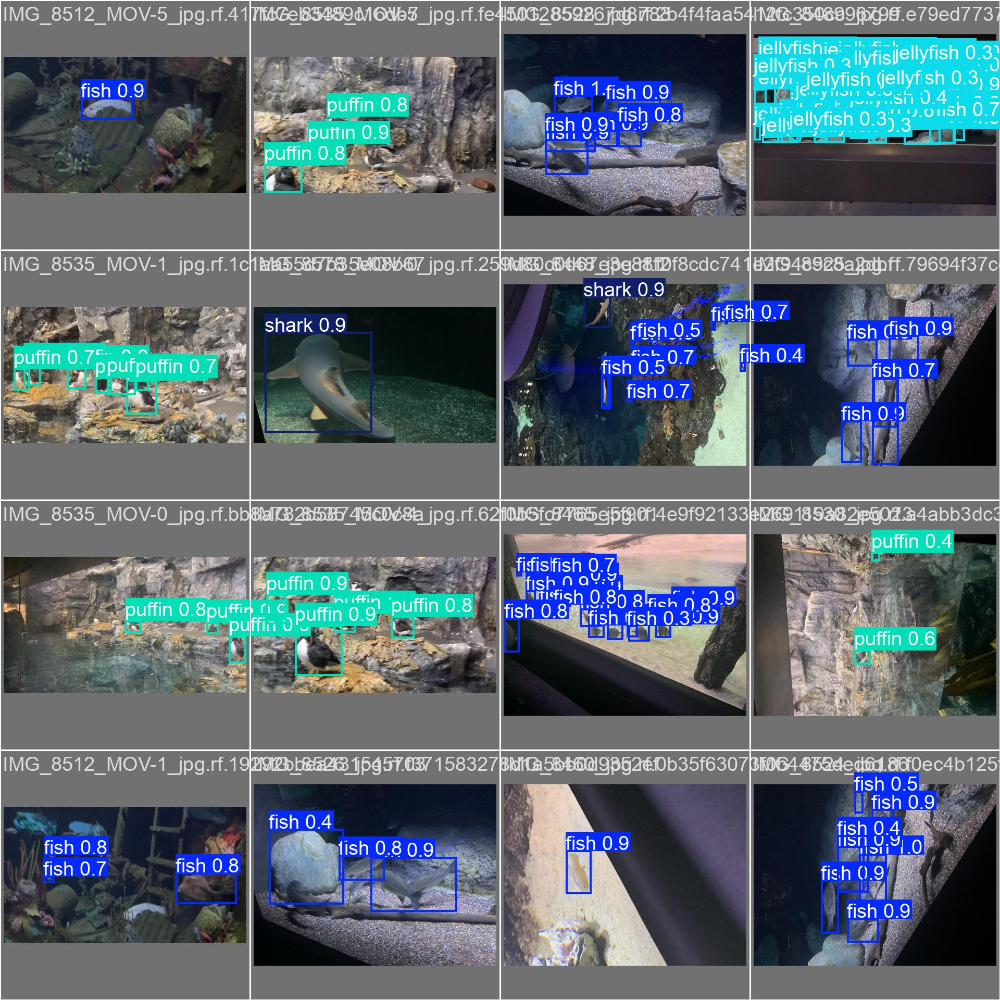

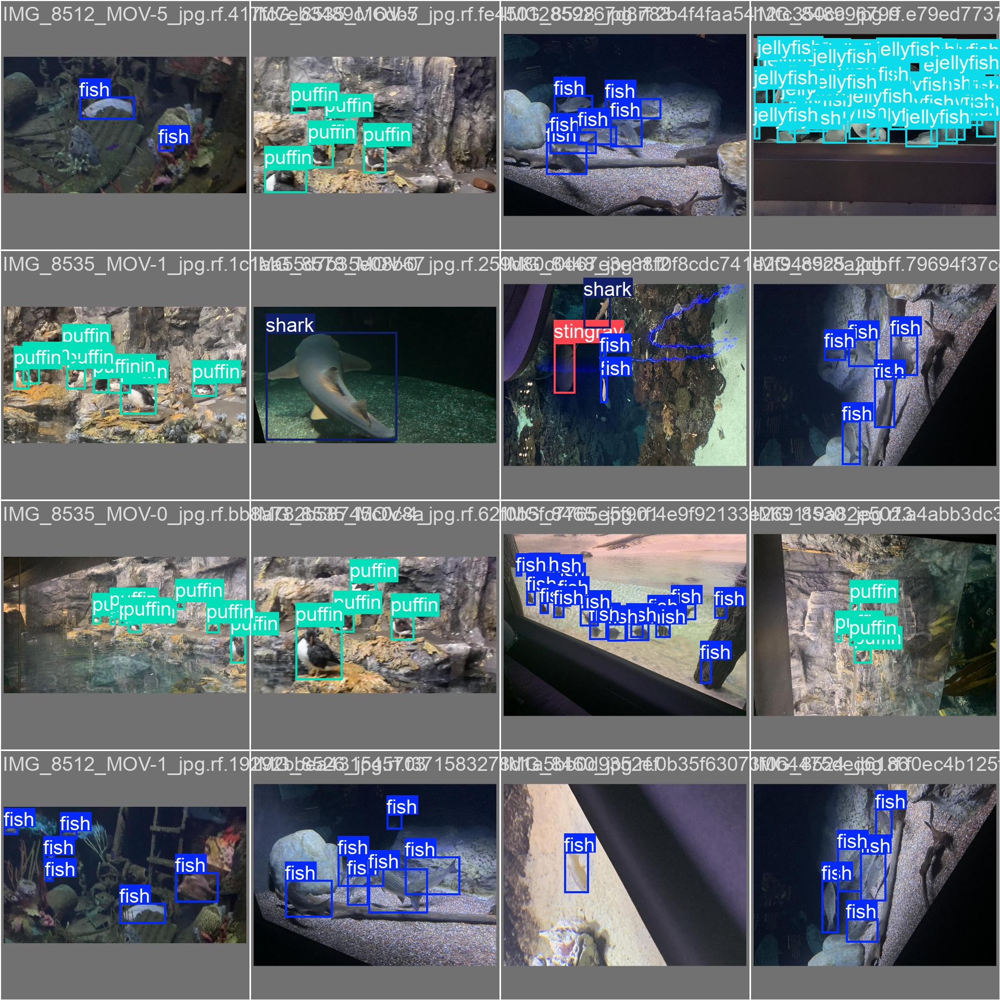

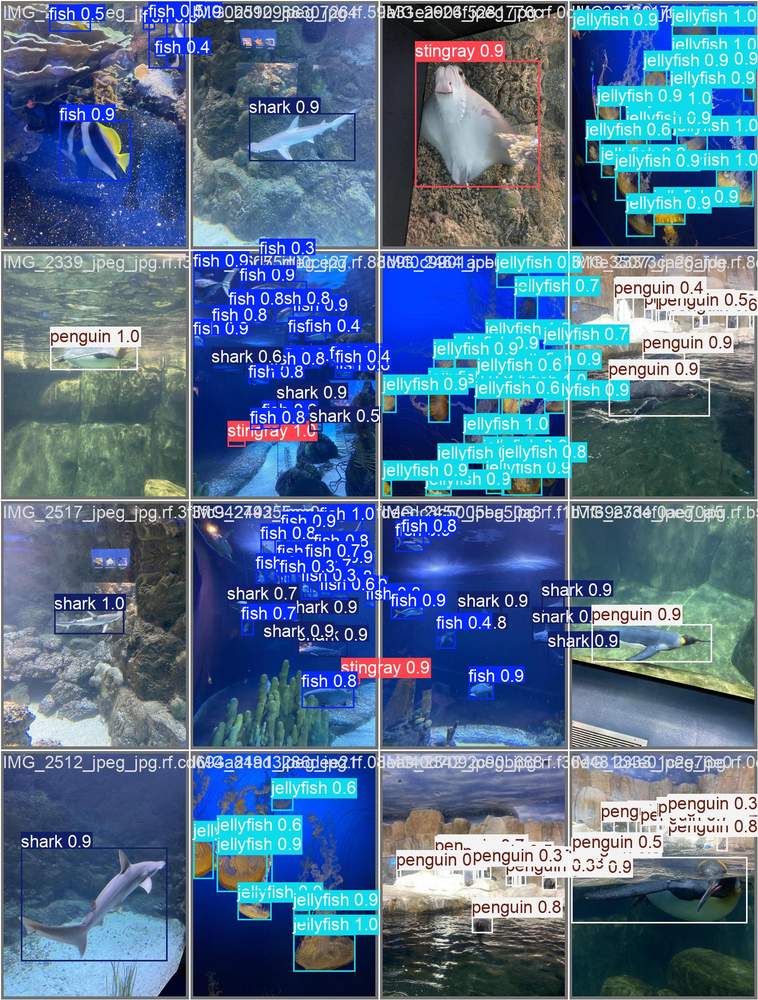

...

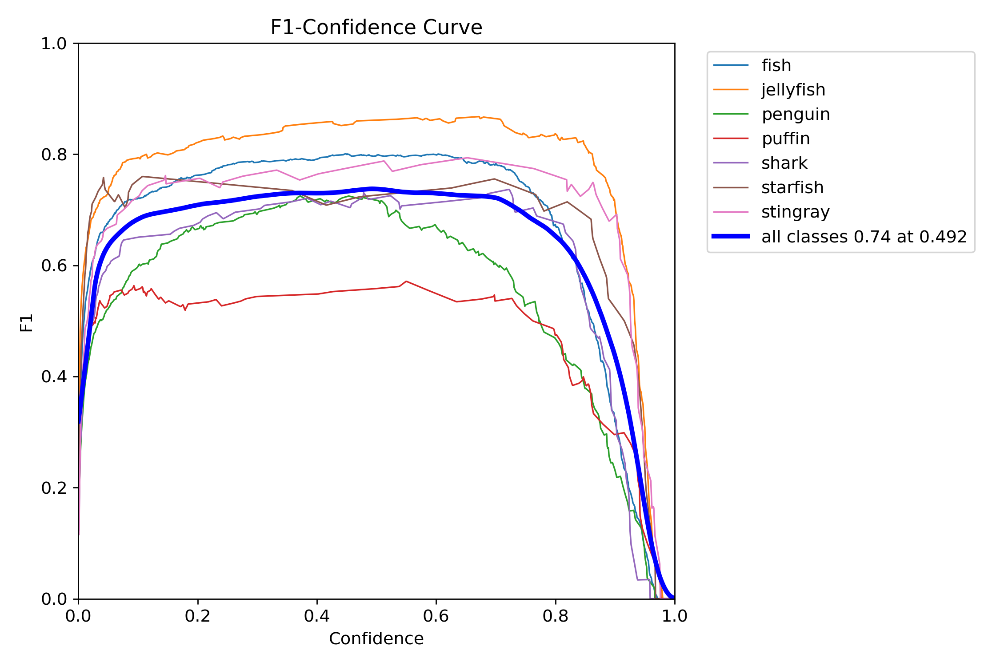

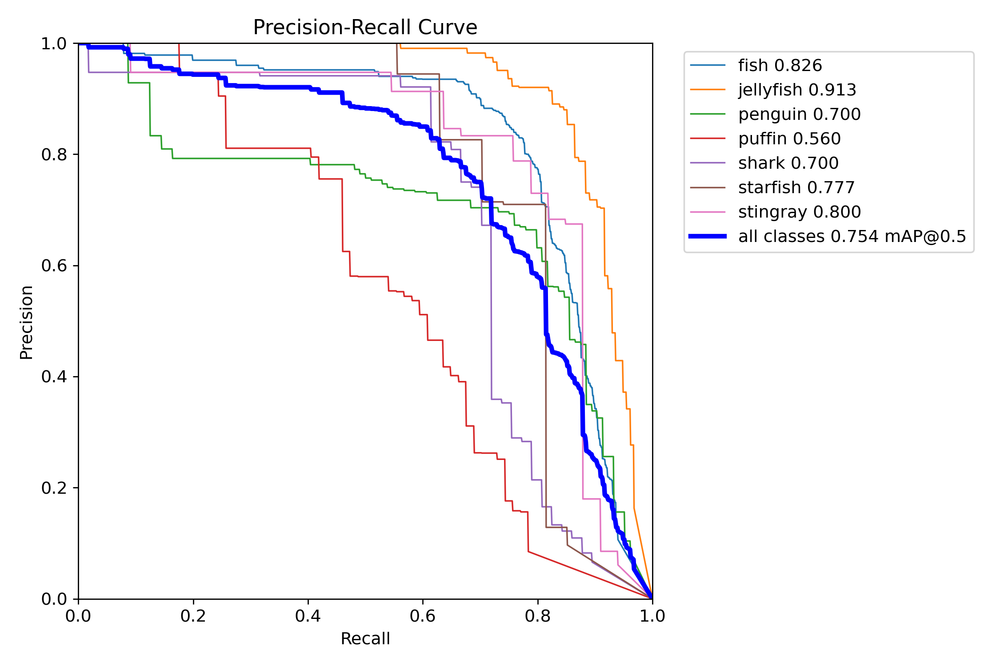

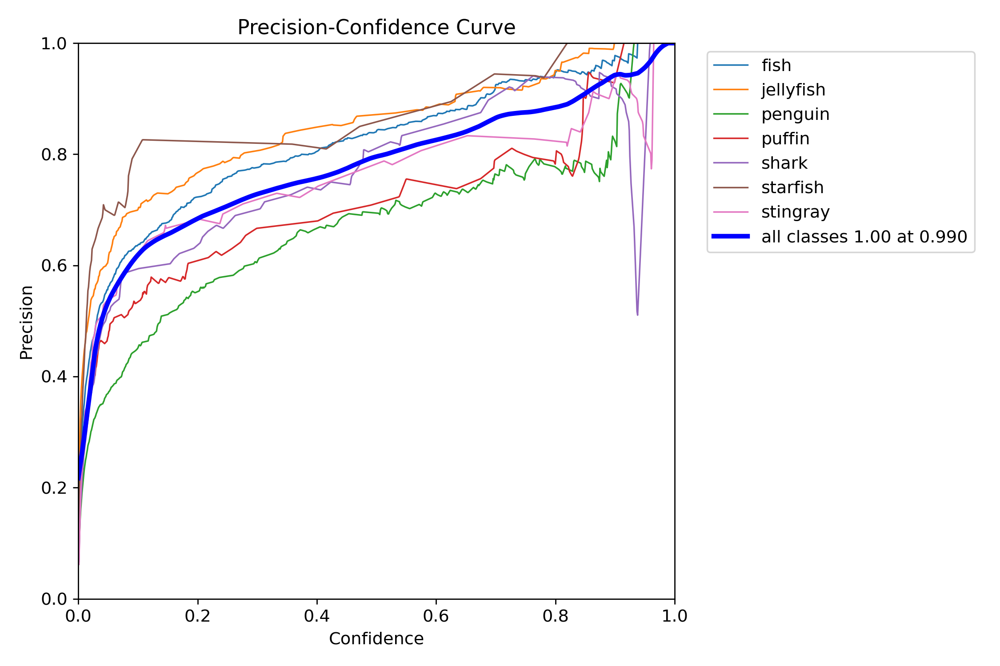

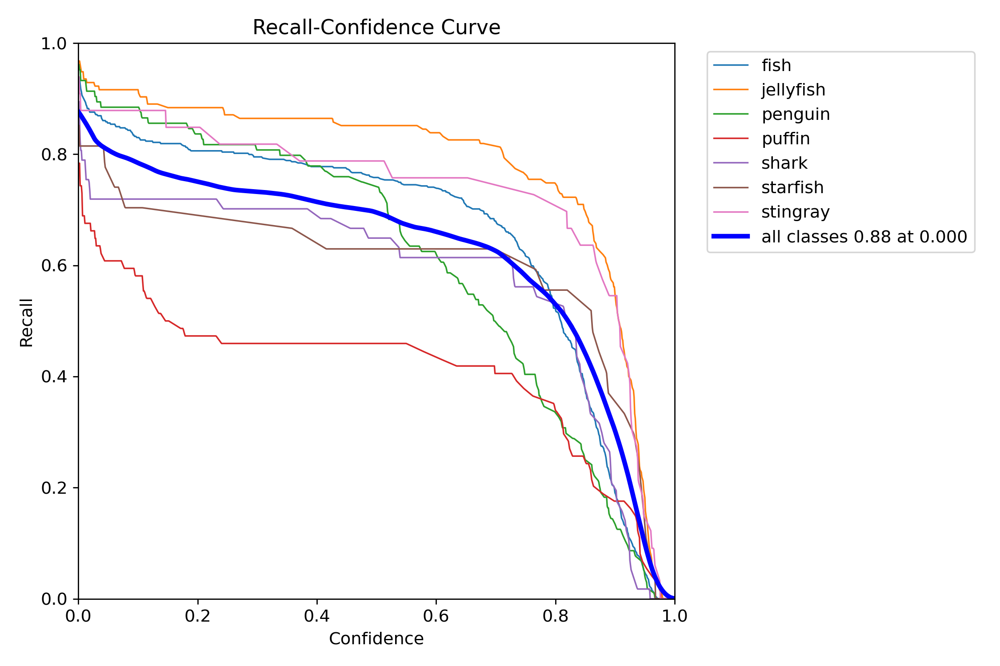

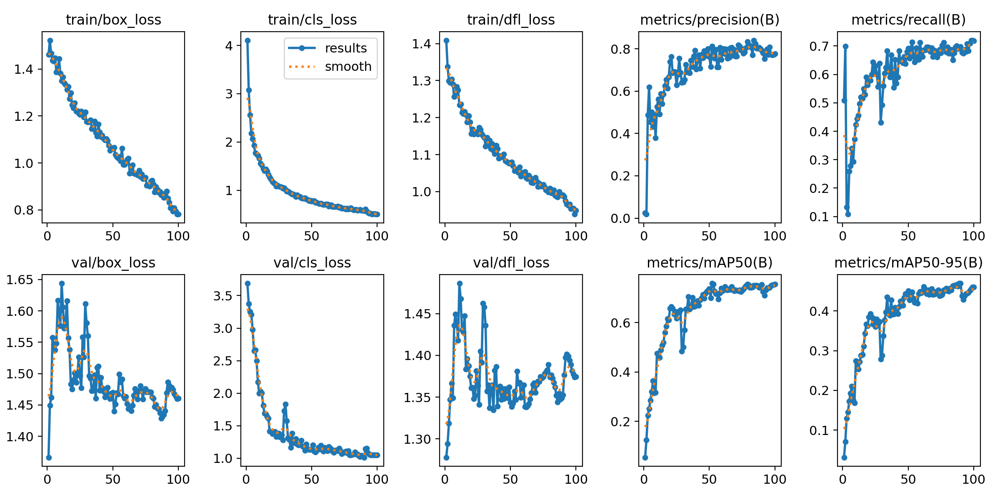

In [ ]:
from IPython.display import Image

image_files = [
    "/content/runs/detect/yolov8n_custom/confusion_matrix.png",
    "/content/runs/detect/yolov8n_custom/confusion_matrix_normalized.png",
    "/content/runs/detect/yolov8n_custom/val_batch0_pred.jpg",
    "/content/runs/detect/yolov8n_custom/val_batch0_labels.jpg",
    "/content/runs/detect/yolov8n_custom/val_batch1_pred.jpg",
    "/content/runs/detect/yolov8n_custom/val_batch1_labels.jpg",
    "/content/runs/detect/yolov8n_custom/train_batch0.jpg",
    "/content/runs/detect/yolov8n_custom/train_batch1.jpg",
    "/content/runs/detect/yolov8n_custom/train_batch2.jpg",
    "/content/runs/detect/yolov8n_custom/labels.jpg",
    "/content/runs/detect/yolov8n_custom/labels_correlogram.jpg",
    "/content/runs/detect/yolov8n_custom/F1_curve.png",
    "/content/runs/detect/yolov8n_custom/PR_curve.png",
    "/content/runs/detect/yolov8n_custom/P_curve.png",
    "/content/runs/detect/yolov8n_custom/R_curve.png",
    "/content/runs/detect/yolov8n_custom/results.png",
]

for image_file in image_files:
    if image_file:
        display(Image(filename=image_file))


----

In [ ]:
# Zip the results to retrieve them locally
import locale

locale.getpreferredencoding = lambda: "UTF-8"
!zip -r /content/fish-results.zip /content/runs/ /content/yolov8n.pt /content/data.yaml


  adding: content/runs/ (stored 0%)
  adding: content/runs/detect/ (stored 0%)
  adding: content/runs/detect/yolov8n_custom/ (stored 0%)
  adding: content/runs/detect/yolov8n_custom/val_batch1_pred.jpg (deflated 1%)
  adding: content/runs/detect/yolov8n_custom/train_batch1170.jpg (deflated 7%)
  adding: content/runs/detect/yolov8n_custom/results.csv (deflated 85%)
  adding: content/runs/detect/yolov8n_custom/labels_correlogram.jpg (deflated 36%)
  adding: content/runs/detect/yolov8n_custom/events.out.tfevents.1727361332.535a10dd6bc8.180.0 (deflated 87%)
  adding: content/runs/detect/yolov8n_custom/train_batch1172.jpg (deflated 11%)
  adding: content/runs/detect/yolov8n_custom/PR_curve.png (deflated 9%)
  adding: content/runs/detect/yolov8n_custom/labels.jpg (deflated 23%)
  adding: content/runs/detect/yolov8n_custom/F1_curve.png (deflated 6%)
  adding: content/runs/detect/yolov8n_custom/train_batch1171.jpg (deflated 7%)
  adding: content/runs/detect/yolov8n_custom/val_batch0_labels.jpg